<a href="https://colab.research.google.com/github/AndreyDyachkov/python-dataviz-machine-learning/blob/main/avocado_pipeline_imputing_scaling_encoding_regression_models.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Avocado Price Prediction Homework

## Conclusion

<b>Dataset characteristics:</b>
The dataset contains average prices and volumes of avocado sales in the USA from 2015 to 1Q2018. The values in the dataset were grouped by locality (mostly cities). However, aggregated data (by the US parts and the US total) were also included in the same dataset.

There is a significant difference in average price between the two categories of avocado:  organic and conventional. Furthermore, average prices fluctuate over the year, so there is seasonality in avocado prices that corresponds with the territories they grow (mostly in the southern hemisphere)

The first unknown column (which looks like an index) is a countdown counter of weeks (or something similar). Even though a few extreme values were found, I didn't remove them as they don't look like outliers on the scatter plots.
A strong correlation between several columns in the dataset was found.

<b>In the process of data preprocessing:</b>
- all rows with aggregated data were removed,
- columns with strong correlation were removed to prevent collinearity,
- a countdown counter (first column) was chosen instead of the month column (just for interest's sake: both columns were suitable to show seasonality)

<b>After splitting the dataset the following transformations were applied using a pipeline approach:</b>
- imputing missing values with SimpleImputer
- encoding categorical values with OneHotEncoder
- scaling numeric values with MinMaxScaler

<b>The following regression models were evaluated:</b>
- linear regression
- random forest regressor
- support vector machine regressor
- gradient boosting regressor
- cat-boosting regressor
- XGBoosting regressor
- Multi-layer Perceptron Regressor

Additionally, a two-layer neural network model was also used for regression.

<b>Results:</b>
A Random Forest  regression model has shown the best result:
- Mean Squared Error on Test Set: 0.014
- Root Mean Squared Error (RMSE): 0.12
- Mean Absolute Error (MAE): 0.082
- R-squared: 0.915
- Explained Variance Score: 0.915


Even though in the real world we would be interested in the prediction of future prices rather than historical ones, the task aimed to apply different regression models as well as data preprocessing tools. To predict future prices, we need more years in the dataset to get the pattern (if it exists), and we can't use any volume features as they don't exist in future periods. Also, other factors, such as weather and the number of hipsters per square meter, affect avocado prices.

### Where do avocados grow?

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


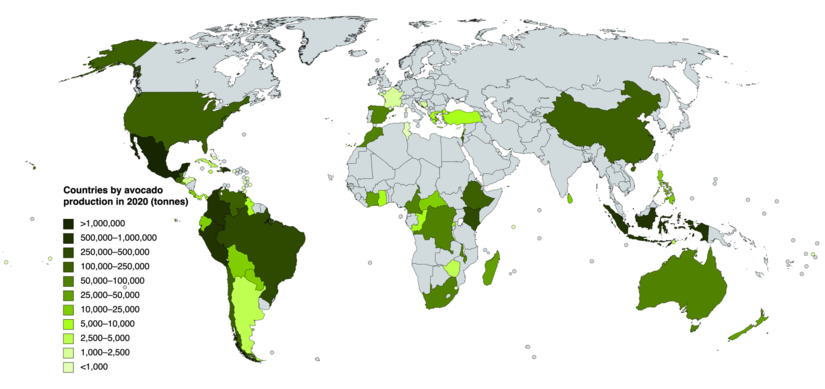

In [ ]:
from IPython.display import Image
Image(filename='/content/drive/MyDrive/Colab Notebooks/SPB_PU_Ogul/data/Countries_by_avocado_production_in_2020.png')

## Import libraries

In [ ]:
#pip install catboost

In [ ]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
import plotly.subplots as sp
import missingno

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR

from catboost import CatBoostRegressor
from xgboost import XGBRegressor


from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, explained_variance_score

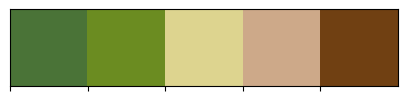

In [ ]:
#palette = ['#F06543','#313638','#F09D51']
palette = ['#4a7337','#6b8c21','#ddd48f','#cda989','#704012']
sns.palplot(palette)

## Import and cleaning data

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/SPB_PU_Ogul/data/Avocado.csv')
df.head()

,Unnamed: 0,Date,AveragePrice,TotalVolume,4046,4225,4770,TotalBags,SmallBags,LargeBags,XLargeBags,type,year,region
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


In [ ]:
df.shape

(18249, 14)

18249 rows and 14 columns

Check for duplicates

In [ ]:
df.duplicated().sum()

0

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    18249 non-null  int64  
 1   Date          18249 non-null  object 
 2   AveragePrice  18249 non-null  float64
 3   TotalVolume   18248 non-null  float64
 4   4046          18248 non-null  float64
 5   4225          18249 non-null  float64
 6   4770          18249 non-null  float64
 7   TotalBags     18248 non-null  float64
 8   SmallBags     18249 non-null  float64
 9   LargeBags     18249 non-null  float64
 10  XLargeBags    18249 non-null  float64
 11  type          18249 non-null  object 
 12  year          18249 non-null  int64  
 13  region        18249 non-null  object 
dtypes: float64(9), int64(2), object(3)
memory usage: 1.9+ MB


Data types are OK, except Date. Let's convert Date column to datetime.

In [ ]:
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d') #format of date

Since the price could vary with the month, let's add a month column

In [ ]:
df['month_num'] = df['Date'].dt.month

Check for missing values

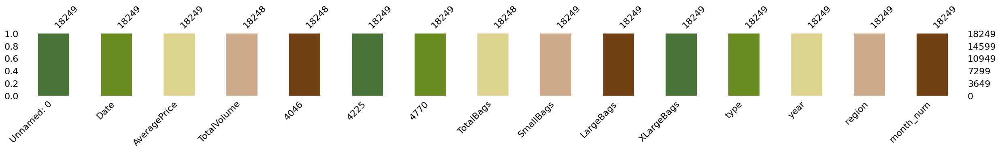

In [ ]:
missingno.bar(df, color=palette, figsize=(30,2))
plt.show()

In [ ]:
missing_val_count_by_column = (df.isnull().sum())
print(missing_val_count_by_column[missing_val_count_by_column > 0])

TotalVolume    1
4046           1
TotalBags      1
dtype: int64


Let's deal with missing values later.

Rename columns and find categorical and numerical columns

In [ ]:
df.columns

Index(['Unnamed: 0', 'Date', 'AveragePrice', 'TotalVolume', '4046', '4225',
       '4770', 'TotalBags', 'SmallBags', 'LargeBags', 'XLargeBags', 'type',
       'year', 'region', 'month_num'],
      dtype='object')

In [ ]:
df.columns = ['unknown_1', 'Date', 'AveragePrice', 'TotalVolume', 'unknown_4046', 'unknown_4225',
       'unknown_4770', 'TotalBags', 'SmallBags', 'LargeBags', 'XLargeBags', 'type',
       'year', 'region', 'month_num']

In [ ]:
num_columns = df.select_dtypes(include=np.number).columns.tolist()
num_columns

['unknown_1',
 'AveragePrice',
 'TotalVolume',
 'unknown_4046',
 'unknown_4225',
 'unknown_4770',
 'TotalBags',
 'SmallBags',
 'LargeBags',
 'XLargeBags',
 'year',
 'month_num']

In [ ]:
series_cat = (df.dtypes == 'object')
cat_columns = list(series_cat[series_cat].index)
cat_columns

['type', 'region']

Everything looks good

## EDA and Feature engineering

### Overall

In [ ]:
df.describe(datetime_is_numeric=True).round(2)

,unknown_1,Date,AveragePrice,TotalVolume,unknown_4046,unknown_4225,unknown_4770,TotalBags,SmallBags,LargeBags,XLargeBags,year,month_num
count,18249.00,18249,18249.00,18248.00,18248.00,18249.00,18249.00,18248.00,18249.00,18249.00,18249.00,18249.00,18249.00
mean,24.23,2016-08-13 23:30:43.498273792,1.41,850669.64,293024.48,295154.57,22839.74,239649.76,182194.69,54338.09,3106.43,2016.15,6.18
min,0.00,2015-01-04 00:00:00,0.44,84.56,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2015.00,1.00
25%,10.00,2015-10-25 00:00:00,1.10,10837.88,854.49,3008.78,0.00,5087.33,2849.42,127.47,0.00,2015.00,3.00
50%,24.00,2016-08-14 00:00:00,1.37,107365.50,8646.20,29061.02,184.99,39741.18,26362.82,2647.71,0.00,2016.00,6.00
75%,38.00,2017-06-04 00:00:00,1.66,433009.80,111028.85,150206.86,6243.42,110784.86,83337.67,22029.25,132.50,2017.00,9.00
max,52.00,2018-03-25 00:00:00,3.25,62505646.52,22743616.17,20470572.61,2546439.11,19373134.37,13384586.80,5719096.61,551693.65,2018.00,12.00
std,15.48,NaN,0.40,3453638.25,1265021.89,1204120.40,107464.07,986268.39,746178.51,243965.96,17692.89,0.94,3.53


In [ ]:
df[cat_columns].describe()

,type,region
count,18249,18249
unique,2,54
top,conventional,Albany
freq,9126,338


Since the type column has only 2 values we can easily visualize data splitting by the type.

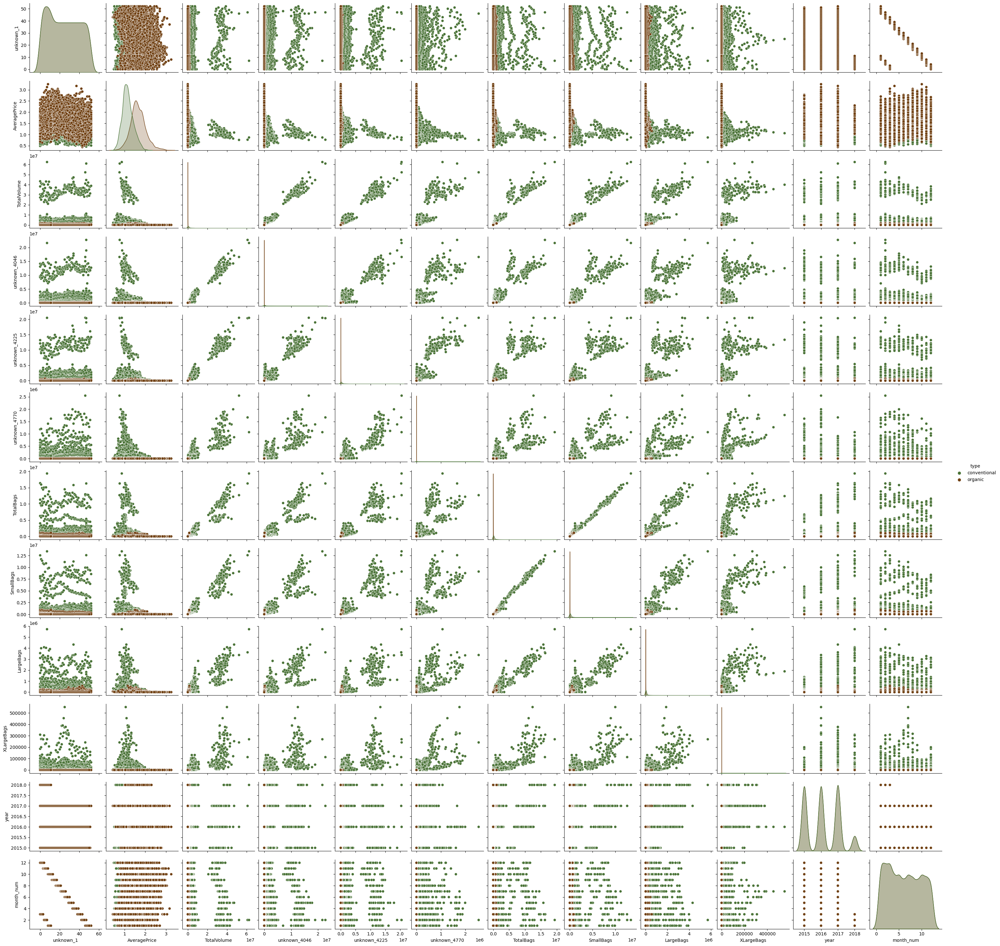

In [ ]:
sns.pairplot(df,palette=palette[0::4],hue='type')
plt.show()

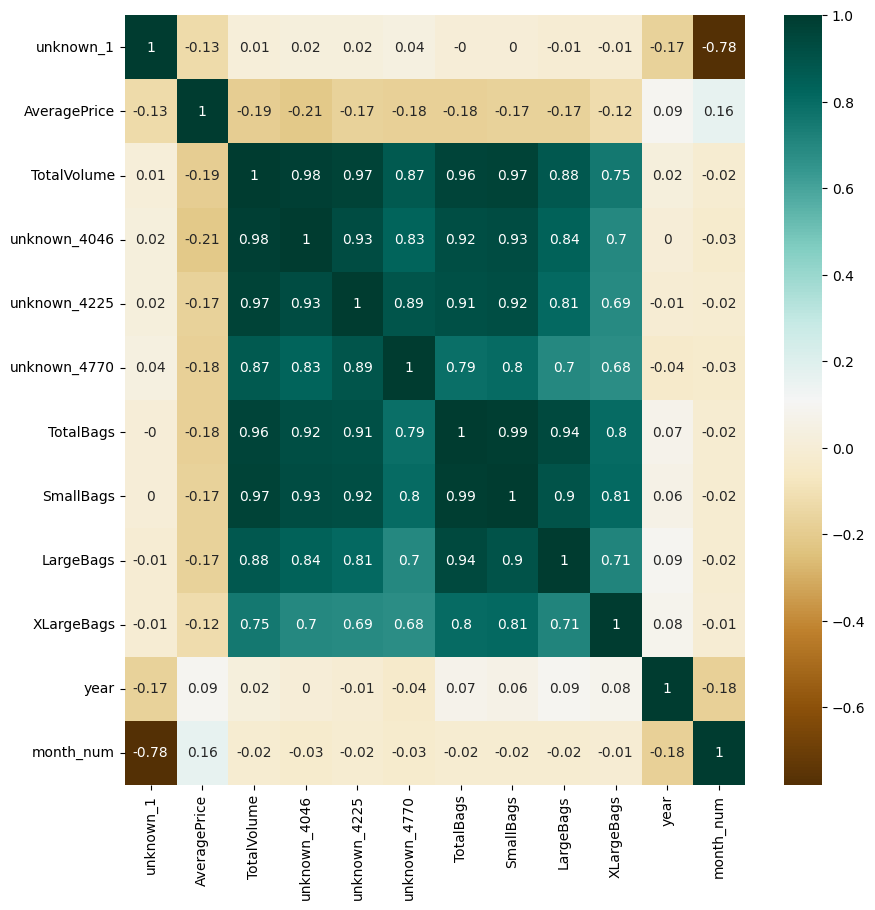

In [ ]:
plt.figure(figsize=(10, 10))
sns.heatmap(df.corr(numeric_only=True).round(2), cmap='BrBG', annot=True)
plt.show()

In [ ]:
for col_name in df.columns:
  fig = px.histogram(df,
                   x=col_name,
                   nbins = 30,
                   color = 'type',
                   barmode="overlay",
                   marginal = 'box',
                     color_discrete_sequence= palette[1:3],
                   title = col_name)
  fig.show()

### Numerical and date columns

#### Unknown_1 column (countdown_index)

- almost uniform distribution
- strong correlation with month number

Let's draw some graphs to see how it relates to date.

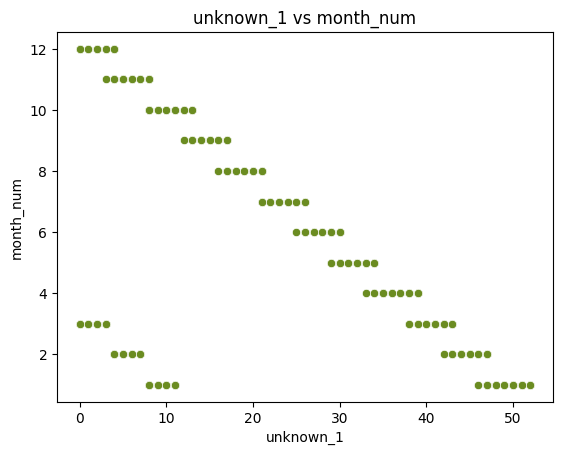

In [ ]:
sns.scatterplot(x=df['unknown_1'], y=df['month_num'], color=palette[1])
plt.title("unknown_1 vs month_num")
plt.show()

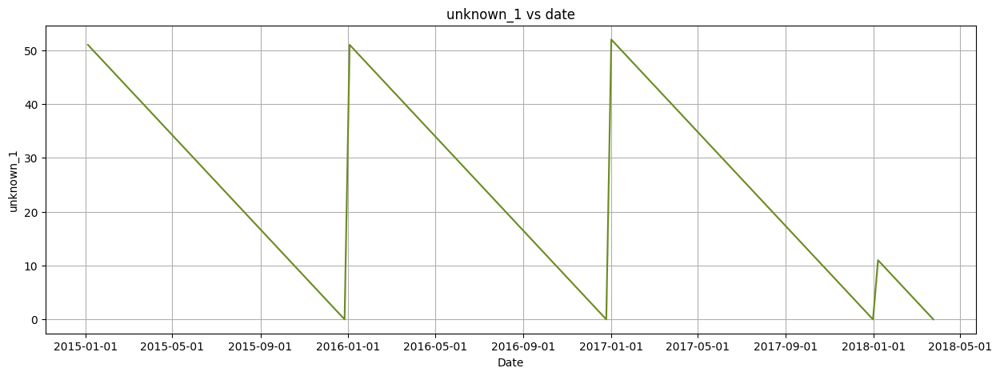

In [ ]:
plt.figure(figsize=(15,5))
sns.lineplot(x='Date', y='unknown_1', data=df, color=palette[1])
plt.title("unknown_1 vs date")
plt.gca().xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%Y-%m-%d')) # Format the date on the X-axis
plt.grid()
plt.show()

So it's a kind of index that does a countdown from the beginning of each year - could be a week number. Let's compare this index with month_num as there can be only one (to remove collinearity).

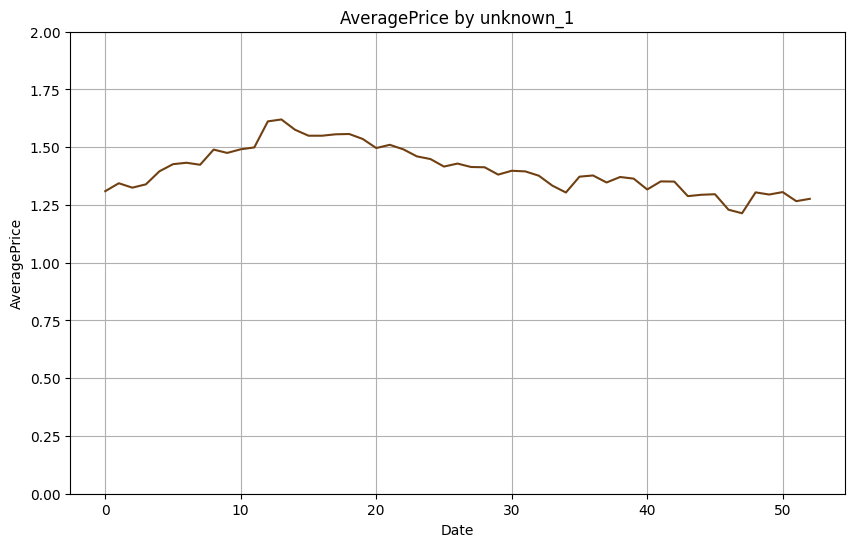

In [ ]:
df.groupby('unknown_1')['AveragePrice'].mean().plot(grid=True,figsize=(10,6),
                  title='AveragePrice by unknown_1',
                  xlabel='Date', ylabel='AveragePrice',ylim=(0,2), color=palette[-1])
plt.show()

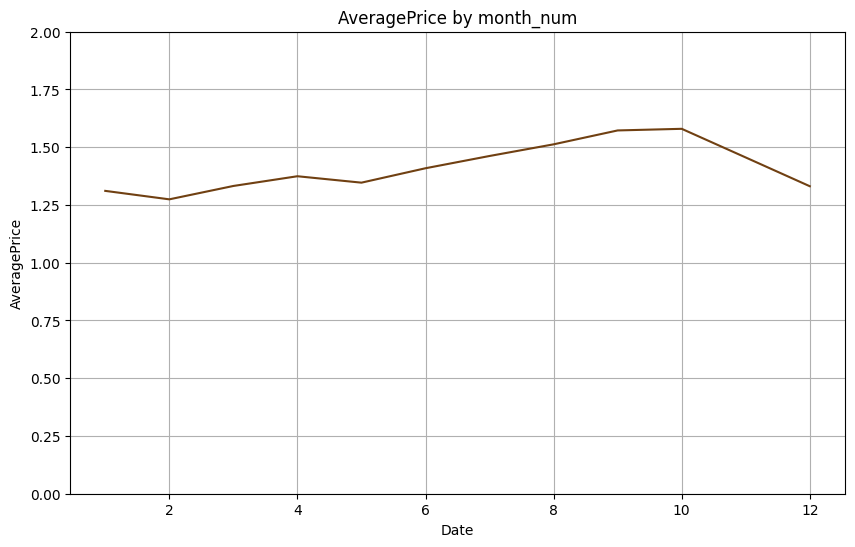

In [ ]:
df.groupby('month_num')['AveragePrice'].mean().plot(grid=True,figsize=(10,6),
                  title='AveragePrice by month_num',
                  xlabel='Date', ylabel='AveragePrice',ylim=(0,2), color=palette[-1])
plt.show()

In [ ]:
fig = sp.make_subplots(rows=1, cols=2)

fig.append_trace(go.Scatter(
   x=df['unknown_1'],
   y=df['AveragePrice'],
   name = "unknown_1 vs AveragePrice",
   marker_color=palette[1],
   mode='markers',
), row=1, col=1)

fig.append_trace(go.Scatter(
   x=df['month_num'],
   y=df['AveragePrice'],
   name = "month_num vs AveragePrice",
   marker_color=palette[-1],
   mode='markers',
), row=1, col=2)

fig.update_layout(title_text="Relationship between unknown_1, month_num and Average price")
fig.show()

In [ ]:
# Create a subplot with 2 rows and 2 columns
fig = sp.make_subplots(rows=2, cols=2, subplot_titles=['unknown_1 vs AveragePrice', 'month_num vs AveragePrice', 'unknown_1 vs AveragePrice', 'month_num vs AveragePrice'])

# Scatterplot 1
scatter1 = go.Scatter(x=df['unknown_1'], y=df['AveragePrice'], mode='markers', marker_color=palette[1])
fig.add_trace(scatter1, row=1, col=1)

# Scatterplot 2
scatter2 = go.Scatter(x=df['month_num'], y=df['AveragePrice'], mode='markers', marker_color=palette[-1])
fig.add_trace(scatter2, row=1, col=2)

# Boxplot 1
box1 = go.Box(x=df['unknown_1'], y=df['AveragePrice'], name='Boxplot 1', marker_color=palette[1])
fig.add_trace(box1, row=2, col=1)

# Boxplot 2
box2 = go.Box(x=df['month_num'], y=df['AveragePrice'], name='Boxplot 2', marker_color=palette[-1])
fig.add_trace(box2, row=2, col=2)

# Update layout
fig.update_layout(title_text="Relationship between unknown_1, month_num and AveragePrice", showlegend=False)

# Show the plot
fig.show()


The plots look quite similar, to be precise, the plots are a mirror image of each other. Let's drop month_num.

In [ ]:
df_cut = df.drop('month_num',axis=1)
df_cut.rename(columns={'unknown_1': 'countdown_index'}, inplace=True)
df_cut.head()

,countdown_index,Date,AveragePrice,TotalVolume,unknown_4046,unknown_4225,unknown_4770,TotalBags,SmallBags,LargeBags,XLargeBags,type,year,region
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


#### Date, year

Year:
- the number of entries is almost the same in 2015, 2016, and 2017, but it was really small in 2018, as there is only first quarter of 2018.

In [ ]:
fig = px.box(df_cut,
             x="year",
             y="AveragePrice",
             points="all",
             title="Average price over years",
             hover_data=["AveragePrice"],
             color_discrete_sequence= [palette[-1]])
fig.show()

If it is a trend in the average price over the years, it is an unclear trend. Since we have only Q1 for 2018 it is incorrect to compare 2018 to other years.

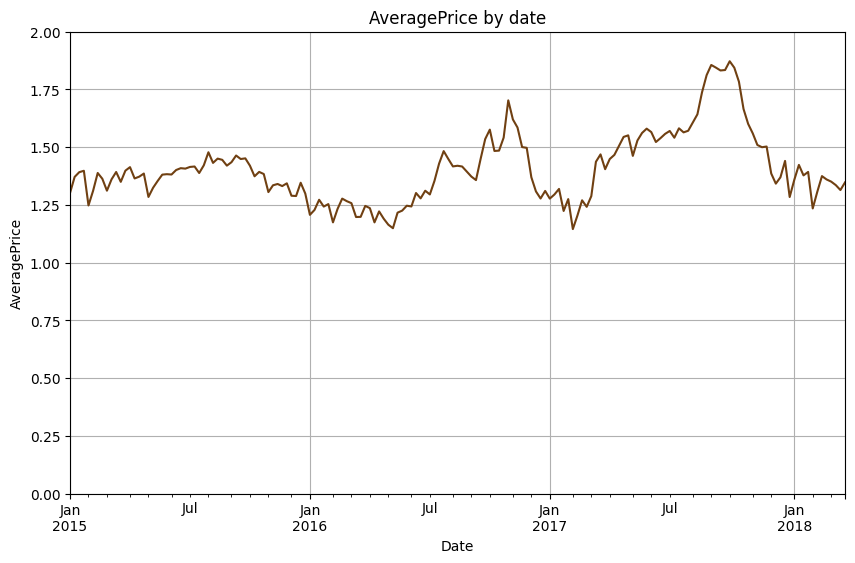

In [ ]:
df_cut.groupby('Date')['AveragePrice'].mean().plot(grid=True,figsize=(10,6),
                  title='AveragePrice by date',
                  xlabel='Date', ylabel='AveragePrice', ylim=(0,2), color=palette[-1])
plt.show()

Let's remove Date

In [ ]:
df_cut = df_cut.drop(['Date'], axis=1)
#df_cut = df_cut.drop(['Date','year'], axis=1)
df_cut.head()

,countdown_index,AveragePrice,TotalVolume,unknown_4046,unknown_4225,unknown_4770,TotalBags,SmallBags,LargeBags,XLargeBags,type,year,region
0,0,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


#### Other numerical columns

 TotalVolume, unknown_4046, unknown_4225, unknown_4770, TotalBags, SmallBags, LargeBags, XLargeBags - all those variables have strong correlation with each other. It seems that they the metrics of the volume of sales.

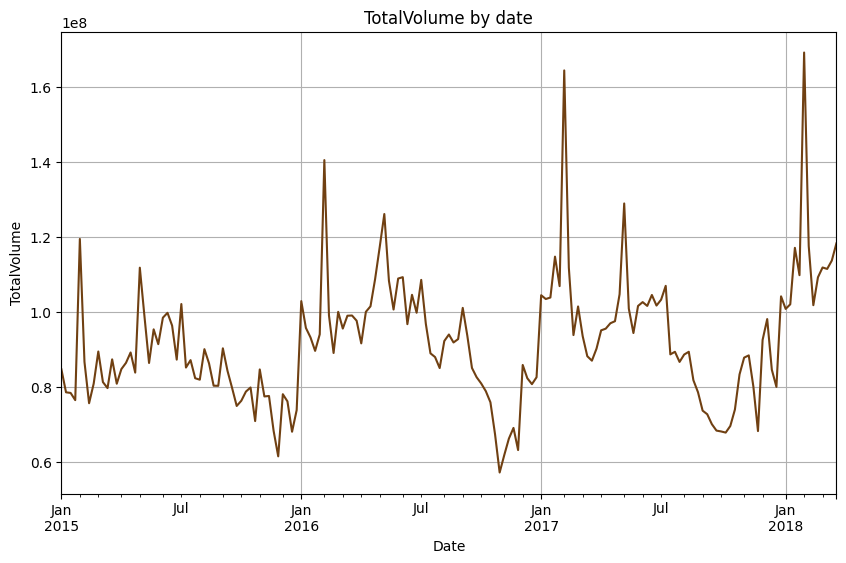

In [ ]:
df.groupby('Date')['TotalVolume'].sum().plot(grid=True,figsize=(10,6),
                  title='TotalVolume by date',
                  xlabel='Date', ylabel='TotalVolume', color=palette[-1])
plt.show()

Let's compare with average price

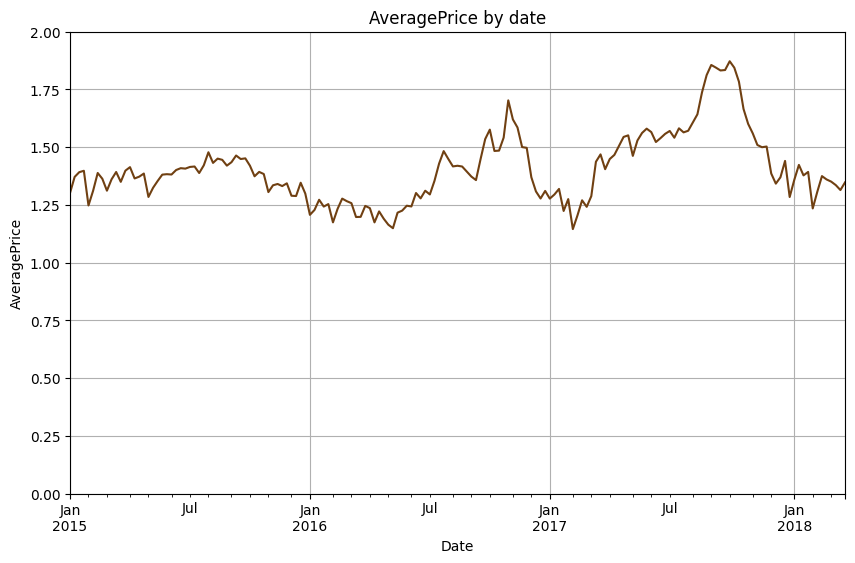

In [ ]:
df.groupby('Date')['AveragePrice'].mean().plot(grid=True,figsize=(10,6),
                  title='AveragePrice by date',
                  xlabel='Date', ylabel='AveragePrice', ylim=(0,2), color=palette[-1])
plt.show()

The same for the countdown week index

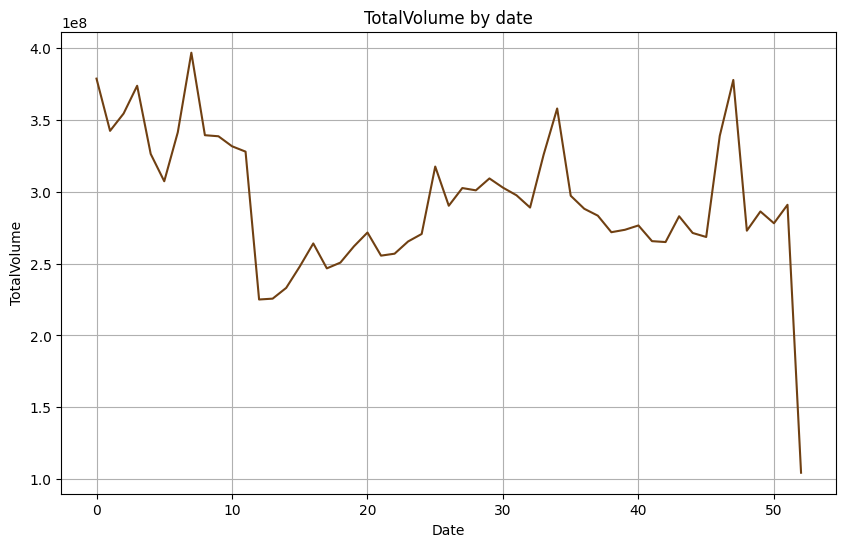

In [ ]:
df_cut.groupby('countdown_index')['TotalVolume'].sum().plot(grid=True,figsize=(10,6),
                  title='TotalVolume by date',
                  xlabel='Date', ylabel='TotalVolume', color=palette[-1])
plt.show()

It seems reasonable that prices soared in Autumn. Avocados are mainly grown in the Southern hemisphere where Autumn is like Spring in our countries.

Let's leave the TotalVolume column and remove the others.

In [ ]:
df_cut = df_cut.drop(['unknown_4046', 'unknown_4225', 'unknown_4770', 'TotalBags', 'SmallBags', 'LargeBags', 'XLargeBags'], axis=1)
df_cut.head()

,countdown_index,AveragePrice,TotalVolume,type,year,region
0,0,1.33,64236.62,conventional,2015,Albany
1,1,1.35,54876.98,conventional,2015,Albany
2,2,0.93,118220.22,conventional,2015,Albany
3,3,1.08,78992.15,conventional,2015,Albany
4,4,1.28,51039.60,conventional,2015,Albany


### Categorical columns

####type

In [ ]:
df_cut['type'].value_counts()

conventional    9126
organic         9123
Name: type, dtype: int64

Usually organic costs more and it is true for avocado as well (we can see this on the boxplot above).

Let's encode this variable later

#### region

In [ ]:
df_cut['region'].value_counts()

Albany                 338
Sacramento             338
Northeast              338
NorthernNewEngland     338
Orlando                338
Philadelphia           338
PhoenixTucson          338
Pittsburgh             338
Plains                 338
Portland               338
RaleighGreensboro      338
RichmondNorfolk        338
Roanoke                338
SanDiego               338
Atlanta                338
SanFrancisco           338
Seattle                338
SouthCarolina          338
SouthCentral           338
Southeast              338
Spokane                338
StLouis                338
Syracuse               338
Tampa                  338
TotalUS                338
West                   338
NewYork                338
NewOrleansMobile       338
Nashville              338
Midsouth               338
BaltimoreWashington    338
Boise                  338
Boston                 338
BuffaloRochester       338
California             338
Charlotte              338
Chicago                338
C

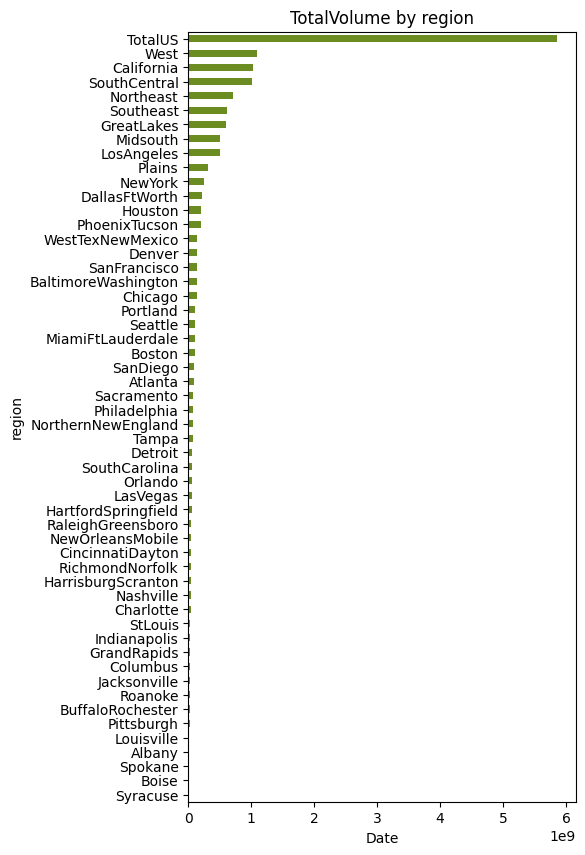

In [ ]:
df_cut.groupby('region')['TotalVolume'].sum().sort_values(ascending=True).plot(kind='barh', grid=False,figsize=(5,10),
                  title='TotalVolume by region',
                  xlabel='Date', ylabel='region', color=palette[1])
plt.show()

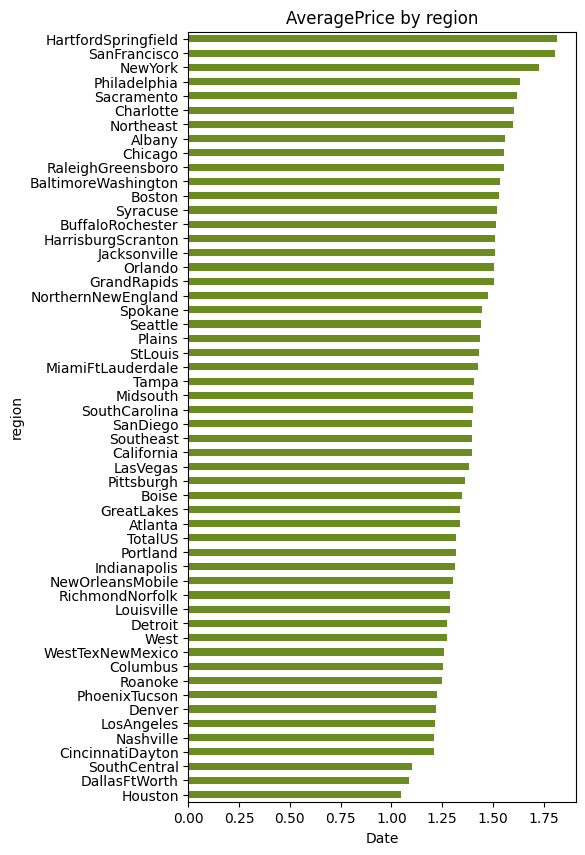

In [ ]:
df_cut.groupby('region')['AveragePrice'].mean().sort_values(ascending=True).plot(kind='barh', grid=False,figsize=(5,10),
                  title='AveragePrice by region',
                  xlabel='Date', ylabel='region', color=palette[1])
plt.show()

So based on those charts we can conclude that the dataset has the Total rows in it. Let's check by comparing the sum of all regions and US total with a pivot table.

In [ ]:
pivot_table = df_cut.pivot_table(values='TotalVolume', index='countdown_index', columns='region', aggfunc='sum', fill_value=0)
#pivot_table.columns = pivot_table.columns.droplevel(0)
pivot_table.columns.name = None
pivot_table = pivot_table.reset_index()
pivot_table

,countdown_index,Albany,Atlanta,BaltimoreWashington,Boise,Boston,BuffaloRochester,California,Charlotte,Chicago,...,SouthCarolina,SouthCentral,Southeast,Spokane,StLouis,Syracuse,Tampa,TotalUS,West,WestTexNewMexico
0,0,408979.41,2207472.20,3113104.97,313073.15,2042831.85,533283.47,24856786.94,951094.37,3484176.59,...,1513800.17,26053093.28,16139617.01,349499.95,674045.99,263464.49,1863700.22,1.435307e+08,25972351.91,3393000.16
1,1,315643.70,2017812.48,3175574.98,321973.13,2165905.50,504254.26,22330797.58,894890.87,3001158.50,...,1357514.43,22201568.77,14266371.18,320419.61,637376.55,226645.11,1588046.71,1.293404e+08,23488369.91,3116196.39
2,2,414291.26,2071403.08,2833461.91,313672.62,2284268.07,512188.74,24069538.92,805402.92,3018608.11,...,1373489.58,21930644.18,14960779.17,314789.34,709200.75,245410.65,1706594.45,1.336362e+08,24371760.94,3132728.27
3,3,434024.67,2016395.77,3253979.72,352892.16,2506945.70,502113.35,23422826.28,877672.45,3279943.92,...,1417633.80,24436135.43,15573820.62,341000.62,614963.00,264113.56,1822008.69,1.409967e+08,26432835.33,3056030.31
4,4,364872.52,1835516.61,2690770.83,308605.62,1827241.68,480303.29,21556810.73,771114.00,2744639.44,...,1243095.57,22124756.78,13038068.49,290425.41,578000.67,229785.53,1482164.72,1.232355e+08,22496249.50,2936947.46
5,5,287805.52,1792784.09,2670392.31,259244.60,1949743.74,438747.68,20309438.91,695617.08,2800694.43,...,1171838.03,20314336.61,12429811.77,279855.92,561921.22,199396.21,1350175.02,1.157178e+08,21189824.42,2853136.23
6,6,375756.35,1966048.97,2917425.04,296990.13,2291198.70,470835.36,21613544.19,785169.44,2651986.07,...,1269293.39,22522959.62,13937874.61,353641.91,641198.91,240978.82,1560826.45,1.287544e+08,24317303.78,3202948.63
7,7,507726.85,2245613.79,3349663.62,332882.75,2445306.67,531740.95,25607103.01,943113.70,3566226.88,...,1508449.38,25473226.31,16001988.31,364885.11,804142.22,283786.81,1770579.61,1.497944e+08,26863805.96,3384676.89
8,8,335650.39,1993484.88,3260285.01,307450.28,2245891.49,492934.49,21284900.76,786228.87,2808128.13,...,1293979.18,22103172.42,13390787.41,289333.83,642199.73,227573.12,1460487.46,1.279815e+08,22966105.98,2853350.41
9,9,383053.91,1970655.48,3129529.30,294338.09,2516032.02,518150.55,21307583.14,860073.50,2745590.93,...,1349529.49,22100237.67,14014210.58,332195.12,757556.26,256777.19,1590884.83,1.278396e+08,22470870.09,2975161.57


In [ ]:
pivot_table['total_sales'] = pivot_table.drop('TotalUS',axis=1).sum(axis=1)
pivot_table[['total_sales','TotalUS']].round(0)

,total_sales,TotalUS
0,235263897.0,143530745.0
1,213096127.0,129340448.0
2,220854778.0,133636194.0
3,232834473.0,140996737.0
4,203141263.0,123235528.0
5,191629713.0,115717821.0
6,212692325.0,128754355.0
7,247040176.0,149794429.0
8,211428212.0,127981471.0
9,210832519.0,127839604.0


Total sales by region don't match TotalUS. So let's check and remove other aggregations

In [ ]:
df_cut[df_cut['region']=='TotalUS']["TotalVolume"].sum()

5864740181.799999

In [ ]:
df_cut[df_cut['region']=='TotalUS']["TotalVolume"].sum() \
- df_cut[df_cut['region']=='West']["TotalVolume"].sum() \
- df_cut[df_cut['region']=='California']["TotalVolume"].sum() \
- df_cut[df_cut['region']=='SouthCentral']["TotalVolume"].sum() \
- df_cut[df_cut['region']=='Northeast']["TotalVolume"].sum() \
- df_cut[df_cut['region']=='Southeast']["TotalVolume"].sum() \
- df_cut[df_cut['region']=='GreatLakes']["TotalVolume"].sum() \
- df_cut[df_cut['region']=='Midsouth']["TotalVolume"].sum() \
- df_cut[df_cut['region']=='Plains']["TotalVolume"].sum()

-0.22000080347061157

We found all the aggregations

In [ ]:
agg_rows = ['TotalUS','West','California','SouthCentral','Northeast','Southeast','GreatLakes','Midsouth','Plains']

In [ ]:
df_cut = df_cut[~df_cut['region'].isin(agg_rows)]
df_cut

,countdown_index,AveragePrice,TotalVolume,type,year,region
0,0,1.33,64236.62,conventional,2015,Albany
1,1,1.35,54876.98,conventional,2015,Albany
2,2,0.93,118220.22,conventional,2015,Albany
3,3,1.08,78992.15,conventional,2015,Albany
4,4,1.28,51039.60,conventional,2015,Albany
...,...,...,...,...,...,...
18244,7,1.63,17074.83,organic,2018,WestTexNewMexico
18245,8,1.71,13888.04,organic,2018,WestTexNewMexico
18246,9,1.87,13766.76,organic,2018,WestTexNewMexico
18247,10,1.93,16205.22,organic,2018,WestTexNewMexico


#### Let's check what we have after removing totals

In [ ]:
missing_val_count_by_column = (df_cut.isnull().sum())
print(missing_val_count_by_column[missing_val_count_by_column > 0])

TotalVolume    1
dtype: int64


Still have one missing value. We will use an imputer later

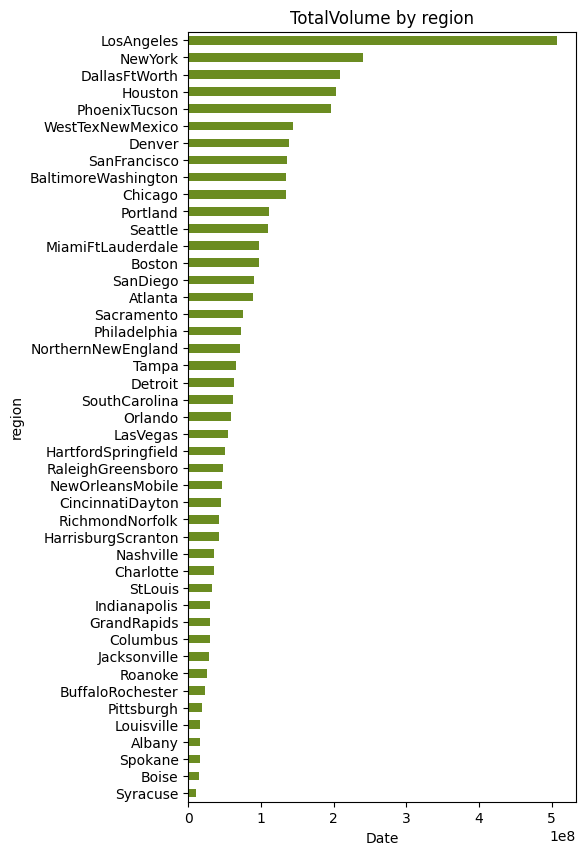

In [ ]:
df_cut.groupby('region')['TotalVolume'].sum().sort_values(ascending=True).plot(kind='barh', grid=False,figsize=(5,10),
                  title='TotalVolume by region',
                  xlabel='Date', ylabel='region', color=palette[1])
plt.show()

LA seems to consume a lot of avocados

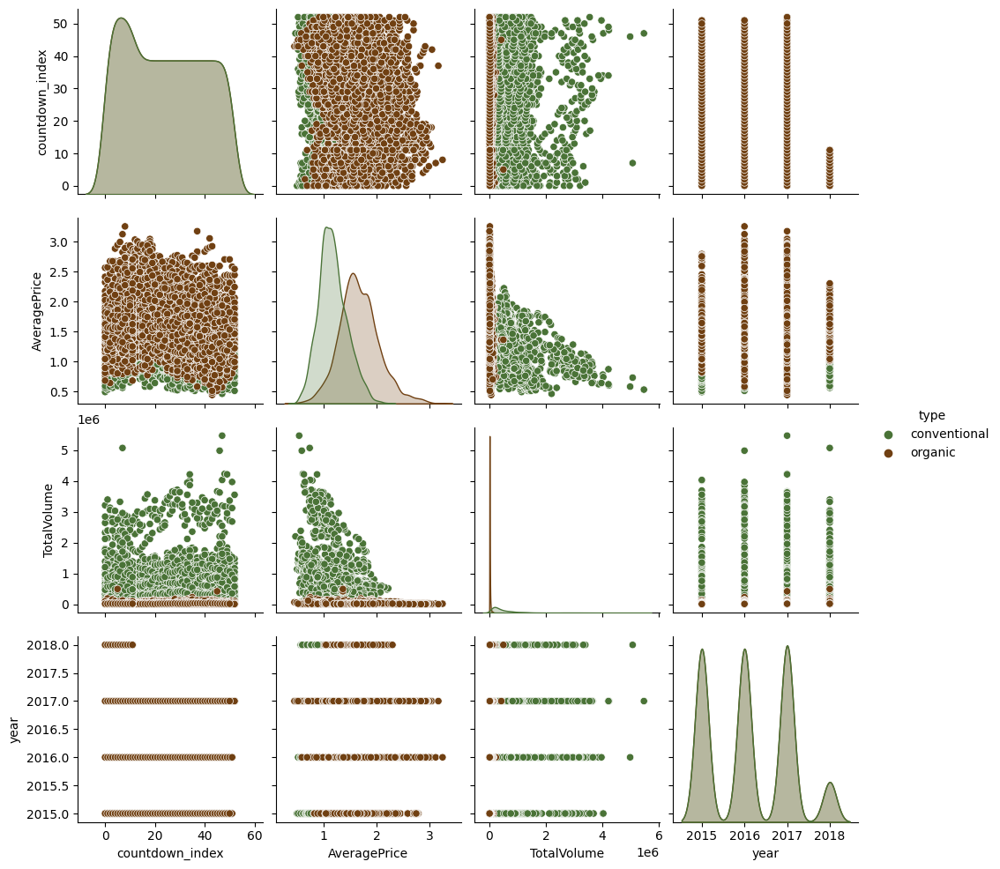

In [ ]:
sns.pairplot(df_cut,palette=palette[0::4],hue='type')
plt.show()

In [ ]:
for col_name in df_cut.columns:
  fig = px.histogram(df_cut,
                   x=col_name,
                   nbins = 30,
                   color = 'type',
                   barmode="overlay",
                   marginal = 'box',
                     color_discrete_sequence= palette[1:3],
                   title = col_name)
  fig.show()

We can see in the boxplot diagram that the Total Volume has outliers. However, on the scatter plots above they don't look like outliers. So let's leave them in the dataset

## Splitting the dataset into train and test data

In [ ]:
X = df_cut.drop('AveragePrice', axis=1)
y = df_cut['AveragePrice']

print(X.shape, y.shape)

(15207, 5) (15207,)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, shuffle=True,random_state=27)  # 80% training, 20% testing
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(12165, 5) (3042, 5) (12165,) (3042,)


## Imputing, scaling, encoding via Pipeline

##### About the pipeline

A Pipeline is a convenient way to assemble multiple steps for data preprocessing and model building into a single object. It streamlines the workflow, making the code more readable, modular, and easier to maintain. The Pipeline class from scikit-learn allows you to chain multiple transformers and a final estimator into a single object.
Here's the role of the Pipeline in this context:

- Preprocessing Steps: The preprocessor is a ColumnTransformer that applies different transformers (imputing, scaling, encoding) to numerical and categorical features. It is defined outside the pipelines to ensure consistency across different models.
- Model Steps: For each machine learning model (LinearRegression, RandomForestRegressor, etc.), a pipeline is created. Each pipeline consists of the common preprocessing steps (preprocessor) and the specific machine learning model.
- Training and Evaluation: The models are trained and evaluated in a loop using the pipelines. This makes it easy to switch between different models without duplicating the preprocessing steps.
- The Pipeline automates the process of applying transformations to the data, fitting the model, and making predictions. It ensures that the same preprocessing steps are applied consistently to both the training and testing sets, and it makes the code more modular and readable.

##### Dealing with categorical and numerical featutres

In [ ]:
# Identify numerical and categorical features
numerical_features = X.select_dtypes(include=['number']).columns.tolist()
categorical_features = X.select_dtypes(include=['object']).columns.tolist()
print('numerical_features', numerical_features)
print('categorical_features', categorical_features)

numerical_features ['countdown_index', 'TotalVolume', 'year']
categorical_features ['type', 'region']


In [ ]:
# Create transformers for numerical and categorical features
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),  # Impute missing values with mean
    ('scaler', MinMaxScaler())                     # Scale numerical features to [0, 1]
])                   # Scale numerical features to [0, 1]

In [ ]:
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),  # Impute missing values with most frequent
    ('onehot', OneHotEncoder(handle_unknown='ignore'))     # One-hot encode categorical features
])

In [ ]:
# Create a preprocessor using ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

## Regression models

In [ ]:
# Create models
linear_model = LinearRegression()
random_forest_model = RandomForestRegressor(n_estimators=100, random_state=42)
support_vector_model = SVR(kernel='linear')
gradient_boosting_model = GradientBoostingRegressor(
                            n_estimators=100,        # Number of boosting stages to be run (number of trees in the ensemble)
                            learning_rate=0.1,       # Shrinkage applied to each tree's contribution to prevent overfitting
                            random_state=42
                          )
cat_boosting_model = CatBoostRegressor(
                      iterations=500,                # Number of boosting rounds or trees in the ensemble
                      depth=6,                       # Maximum depth of each tree in the ensemble
                      learning_rate=0.1,             # Shrinkage applied to each tree's contribution to prevent overfitting
                      loss_function='RMSE',          # The loss function used for training, here it's Root Mean Squared Error (RMSE)
                      random_seed=42)
xgboosting_model = XGBRegressor(
                    n_estimators=500,                # Number of boosting rounds or trees in the ensemble
                    max_depth=6,                     # Maximum depth of each tree in the ensemble
                    learning_rate=0.1,               # Shrinkage applied to each tree's contribution to prevent overfitting
                    objective='reg:squarederror',    # The learning objective for the model, here it's regression with squared error
                    random_state=42
                   )
mlp_model = MLPRegressor(
              hidden_layer_sizes=(100,),             # Tuple specifying the number of neurons in each hidden layer
              max_iter=1000,                         # Maximum number of iterations (epochs) for training
              random_state=42
            )

##### About MLPRegressor

`MLPRegressor` stands for Multi-layer Perceptron Regressor, and it is a type of neural network-based regressor in scikit-learn. Multi-layer perceptrons (MLPs) are a class of feedforward artificial neural networks, and they can be used for both regression and classification tasks.

In the context of regression, `MLPRegressor` models aim to predict a continuous target variable. The architecture of an MLP includes an input layer, one or more hidden layers, and an output layer. Each layer consists of nodes (neurons), and each connection between nodes has an associated weight.

Some key parameters of `MLPRegressor` include:

- `hidden_layer_sizes`: A tuple representing the number of nodes in each hidden layer. For example, `(100, 50)` means there are two hidden layers, the first with 100 nodes and the second with 50 nodes.

- `activation`: The activation function used for hidden layers. Common choices include 'relu' (Rectified Linear Unit), 'logistic' (sigmoid function), and 'tanh' (hyperbolic tangent).

- `solver`: The optimization algorithm used for weight optimization. Common choices include 'adam', 'sgd' (stochastic gradient descent), and 'lbfgs'.

- `max_iter`: The maximum number of iterations for training the neural network.

- `random_state`: A seed for reproducibility.

##### Pipelines

In [ ]:
# Create pipelines with the preprocessor and respective models
linear_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                   ('model', linear_model)])

random_forest_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                          ('model', random_forest_model)])

support_vector_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                          ('model', support_vector_model)])

gradient_boosting_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                          ('model', gradient_boosting_model)])

cat_boosting_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                          ('model', cat_boosting_model)])

xgboosting_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                          ('model', xgboosting_model)])

mlp_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                           ('model', mlp_model)])

In [ ]:
# Evaluation function
def evaluate(true, predicted):
  mse = mean_squared_error(true, predicted)
  rmse = np.sqrt(mse)
  mae = mean_absolute_error(true, predicted)
  r2 = r2_score(true, predicted)
  explained_var = explained_variance_score(true, predicted)
  print('Mean Squared Error on Test Set:', mse.round(3))
  print("Root Mean Squared Error (RMSE):", rmse.round(3))
  print("Mean Absolute Error (MAE):", mae.round(3))
  print("R-squared:", r2.round(3))
  print("Explained Variance Score:", explained_var.round(3))

In [ ]:
# Train and evaluate the models
models_part1 = [('Linear Regression', linear_pipeline),
          ('Random Forest', random_forest_pipeline),
          ('Support Vector Regression', support_vector_pipeline),
          ('GradientBoostingRegressor', gradient_boosting_pipeline),
          ('XGBoostingRegressor', xgboosting_pipeline),
          ('MLP Regressor', mlp_pipeline)]

In [ ]:
# Train and evaluate the models
models_part2 = [('CatBoostingRegressor', cat_boosting_pipeline)]

In [ ]:
for model_name, model in models_part1:
    print(f"Training and evaluating {model_name}...")
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    evaluate(y_test, predictions)
    print('\n')

Training and evaluating Linear Regression...
Mean Squared Error on Test Set: 0.072
Root Mean Squared Error (RMSE): 0.269
Mean Absolute Error (MAE): 0.204
R-squared: 0.574
Explained Variance Score: 0.574


Training and evaluating Random Forest...
Mean Squared Error on Test Set: 0.014
Root Mean Squared Error (RMSE): 0.12
Mean Absolute Error (MAE): 0.082
R-squared: 0.915
Explained Variance Score: 0.915


Training and evaluating Support Vector Regression...
Mean Squared Error on Test Set: 0.073
Root Mean Squared Error (RMSE): 0.27
Mean Absolute Error (MAE): 0.202
R-squared: 0.57
Explained Variance Score: 0.57


Training and evaluating GradientBoostingRegressor...
Mean Squared Error on Test Set: 0.049
Root Mean Squared Error (RMSE): 0.222
Mean Absolute Error (MAE): 0.167
R-squared: 0.71
Explained Variance Score: 0.71


Training and evaluating XGBoostingRegressor...
Mean Squared Error on Test Set: 0.016
Root Mean Squared Error (RMSE): 0.125
Mean Absolute Error (MAE): 0.087
R-squared: 0.908
E

In [ ]:
for model_name, model in models_part2:
    print(f"Training and evaluating {model_name}...")
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    evaluate(y_test, predictions)
    print('\n')

Training and evaluating CatBoostingRegressor...
0:	learn: 0.3941620	total: 7.76ms	remaining: 3.87s
1:	learn: 0.3778589	total: 10.5ms	remaining: 2.62s
2:	learn: 0.3623959	total: 14.3ms	remaining: 2.36s
3:	learn: 0.3490341	total: 17.9ms	remaining: 2.22s
4:	learn: 0.3382812	total: 26.2ms	remaining: 2.6s
5:	learn: 0.3282605	total: 30.4ms	remaining: 2.5s
6:	learn: 0.3203939	total: 33.2ms	remaining: 2.33s
7:	learn: 0.3133479	total: 36.3ms	remaining: 2.23s
8:	learn: 0.3068788	total: 40.9ms	remaining: 2.23s
9:	learn: 0.3016242	total: 44.2ms	remaining: 2.17s
10:	learn: 0.2962674	total: 47.4ms	remaining: 2.11s
11:	learn: 0.2921471	total: 53.2ms	remaining: 2.16s
12:	learn: 0.2882398	total: 57.2ms	remaining: 2.14s
13:	learn: 0.2843929	total: 60.8ms	remaining: 2.11s
14:	learn: 0.2813241	total: 69.4ms	remaining: 2.24s
15:	learn: 0.2781037	total: 77.3ms	remaining: 2.34s
16:	learn: 0.2754515	total: 81.8ms	remaining: 2.32s
17:	learn: 0.2728127	total: 86.4ms	remaining: 2.31s
18:	learn: 0.2706567	total: 

## Neural network

##### Preprocess the data

In [ ]:
# Create a pipeline including the preprocessor
model = Pipeline(steps=[
    ('preprocessor', preprocessor),
])

# Fit the preprocessor on the training data
model.fit(X_train)

# Transform the training data using the preprocessor
X_train_preprocessed = model.transform(X_train).toarray()

# Transform the test data using the preprocessor
X_test_preprocessed = model.transform(X_test).toarray()

##### Build and train the neural network

In [ ]:
# Keras Sequential Neural Network
def create_neural_network(input_dim):
    model = Sequential([
        Dense(25, activation='relu', input_dim=input_dim),
        Dense(1)  # Output layer for regression
    ])
    model.compile(optimizer='adam', loss='mean_squared_error')
    return model

In [ ]:
# Build the neural network model
nn_model = create_neural_network(input_dim=X_train_preprocessed.shape[1])

In [ ]:
# Train the model
history = nn_model.fit(
    X_train_preprocessed, y_train,
    epochs=25, batch_size=64, verbose=1,
    validation_data=(X_test_preprocessed, y_test)
)

Epoch 1/25
191/191 [==============================] - 2s 4ms/step - loss: 0.6843 - val_loss: 0.1430
Epoch 2/25
191/191 [==============================] - 1s 3ms/step - loss: 0.1078 - val_loss: 0.0864
Epoch 3/25
191/191 [==============================] - 0s 2ms/step - loss: 0.0802 - val_loss: 0.0728
Epoch 4/25
191/191 [==============================] - 0s 2ms/step - loss: 0.0724 - val_loss: 0.0684
Epoch 5/25
191/191 [==============================] - 0s 2ms/step - loss: 0.0693 - val_loss: 0.0662
Epoch 6/25
191/191 [==============================] - 0s 2ms/step - loss: 0.0673 - val_loss: 0.0644
Epoch 7/25
191/191 [==============================] - 0s 2ms/step - loss: 0.0657 - val_loss: 0.0631
Epoch 8/25
191/191 [==============================] - 0s 2ms/step - loss: 0.0643 - val_loss: 0.0619
Epoch 9/25
191/191 [==============================] - 0s 2ms/step - loss: 0.0631 - val_loss: 0.0607
Epoch 10/25
191/191 [==============================] - 0s 2ms/step - loss: 0.0619 - val_loss: 0.0595

In [ ]:
num_epochs = len(history.history['loss'])

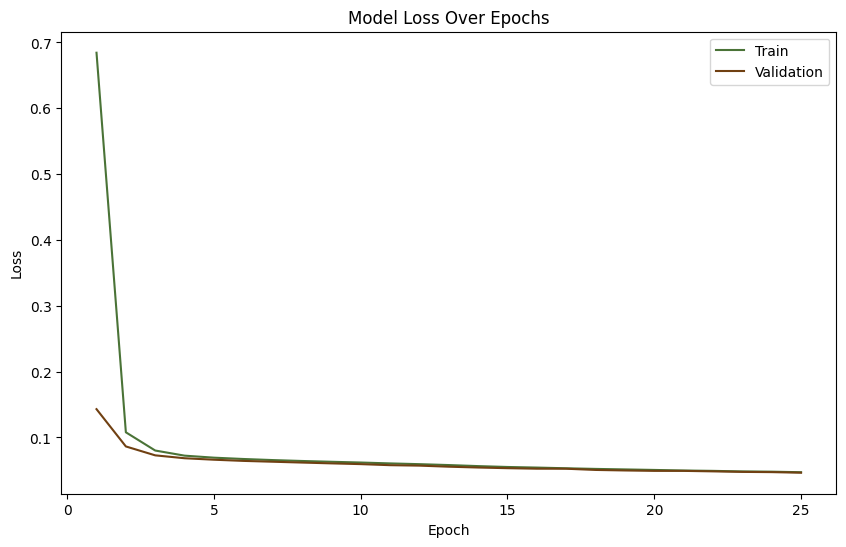

In [ ]:
# Plot training & validation loss values
plt.figure(figsize=(10, 6))
sns.lineplot(x=range(1, num_epochs + 1),y=history.history['loss'], label='Train', color=palette[0])
sns.lineplot(x=range(1, num_epochs + 1), y=history.history['val_loss'], label='Validation', color=palette[-1])
plt.title('Model Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# Make predictions on the test set
y_pred = nn_model.predict(X_test_preprocessed).squeeze()

96/96 [==============================] - 0s 1ms/step


In [ ]:
# Evaluate the model
evaluate(y_test, y_pred)

Mean Squared Error on Test Set: 0.046
Root Mean Squared Error (RMSE): 0.216
Mean Absolute Error (MAE): 0.157
R-squared: 0.727
Explained Variance Score: 0.728
